In [1]:
# Install igraph
!pip install igraph

# move to the directory where the foodweb graphs are located.
import os
import itertools

# importing libraries
import igraph as ig
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import pandas as pd
from collections import Counter

import pickle

# display plots in the notebook
%matplotlib inline
from matplotlib import rcParams

from datetime import datetime

from IPython.display import HTML, display
import time

Defaulting to user installation because normal site-packages is not writeable


In [2]:
class Progress():
  def __init__(self, max=100, title_name='', status=''):
    self.max = max
    if title_name != '':
      title_name += ': '
    self.title_name = title_name
    self.status = status
    self.progress_bar = display(self.progress(0, self.status), display_id=True)

  def show(self, value, status = None):
    self.progress_bar.update(self.progress(value, status))

  def progress(self,value,status):
    """
    A progress bar.
    """
    if status is not None:
      self.status = status
    return HTML("""
    <label for='text'>{title_name} {status}</label>
        <progress
            value='{value}'
            max='{max}',
            style='width: 100%'
        >
            {value}
        </progress>
    """.format(value=value, max=self.max, title_name=self.title_name, status=self.status))

In [3]:
def create_folder(path):
  folder = os.path.dirname(os.path.abspath(path))
  if os.path.exists(folder) is False:
    os.mkdir(folder)

In [4]:
def visual_style(g, layout=None, size_mode=None):
  # set layout
  if layout is None:
    layout = g.layout_fruchterman_reingold(niter=1000)

  # these properties will be used to set the graph aspect
  try:
    weights = [e['weight'] for e in g.es()]
  except:
    weights = [1.0 for e in g.es()]
  betweenness = g.betweenness()
  eigenvector = g.eigenvector_centrality()

  palette = {
    1: '#1f77b4',
    2: '#ff7f0e',
    3: '#2ca02c',
    4: '#d62728',
    5: '#9467bd',
  }

  visual_style = {}
  # set visual style
  visual_style = {}
  ## set vertex labels to be the name of the vertex of the graph
  visual_style['vertex_label'] = [v['name'] for v in g.vs()]
  ## change label size according to the betweenness
  if size_mode == 'betweenness':
    visual_style['vertex_size'] = [b/max(betweenness)*0.7 + 0.1 for b in betweenness]
  elif size_mode == 'eigenvector':
    visual_style['vertex_size'] = [b/max(eigenvector)*0.7 + 0.1 for b in eigenvector]
  else:
    visual_style['vertex_size'] = 0.2
  ## change color according to the vertex 'ECO' property
  visual_style['vertex_color'] = [palette[v['ECO']] for v in g.vs()]
  ## change the width of the verteces
  visual_style['vertex_frame_width'] = 0.2


  ## set edge color to be gray. The higher the weight of the lower the transparancy
  visual_style['edge_color'] = [(0.5, 0.5, 0.5, 1) for w in weights]
  ## change edge width
  visual_style['edge_width'] = 0.1


  ## change vertex labels' size
  visual_style['vertex_label_size'] = 3

  ## set the layout into the dictionary
  visual_style['layout'] = layout

  return visual_style

In [5]:
def index_from_dataset(G_dataset, name):
  for i, G in enumerate(G_dataset):
    if G['name'] == name:
      return i
  print(f"{name} not found in dataset...")
  return None

In [6]:
# Collecting the graphs
## Option: to include or not include the "artificial nodes"

living_other = False

G_dataset = []
dataset_path = '../dataset'
for file_name in sorted(os.listdir(dataset_path)):
    print(file_name)
    if file_name.endswith(".graphml"):
        print(f"Reading {file_name}:", end=' ')
        G = ig.Graph.Read_GraphML(os.path.join(dataset_path, file_name))
        print(f"{G['name']} - {G['nickname']}")

        if living_other:
          keep = list(np.argwhere(np.array(G.vs()['ECO']) == 1.0).ravel()) + list(np.argwhere(np.array(G.vs()['ECO']) == 2.0).ravel())
          G = G.subgraph(keep)
          degree_keep = G.degree()
          keep = list(np.argwhere(np.array(degree_keep) > 0).ravel())
          G = G.subgraph(keep)
        G_dataset.append(G)

ChesLower.graphml
Reading ChesLower.graphml: Lower Chesapeake Bay - LCB
ChesMiddle.graphml
Reading ChesMiddle.graphml: Middle Chesapeake Bay - MCB
ChesUpper.graphml
Reading ChesUpper.graphml: Upper Chesapeake Bay - UCB
Chesapeake.graphml
Reading Chesapeake.graphml: Chesapeake Bay Mesohaline - CBM
CrystalC.graphml
Reading CrystalC.graphml: Crystal River Creek - Control - CRC
CrystalD.graphml
Reading CrystalD.graphml: Crystal River Creek - Delta Temp - CRD
Maspalomas.graphml
Reading Maspalomas.graphml: Charca de Maspalomas - CdM
Michigan.graphml
Reading Michigan.graphml: Lake Michigan - LM
Mondego.graphml
Reading Mondego.graphml: Mondego Estuary - Zostrea site - MON
Narragan.graphml
Reading Narragan.graphml: Narragansett Bay Model - NARR
StMarks.graphml
Reading StMarks.graphml: St. Marks River (Florida) - StM
artic_seas_29.graphml
Reading artic_seas_29.graphml: Arctic seas - ARC
baydry.graphml
Reading baydry.graphml: Florida Bay - dry season - FDRY
baywet.graphml
Reading baywet.graphml: 

/tmp/ipykernel_16323/3005287663.py:12: RuntimeWarning: Could not add vertex ids, there is already an 'id' vertex attribute. at src/io/graphml.c:485
  G = ig.Graph.Read_GraphML(os.path.join(dataset_path, file_name))


# Motifs

Triad census of a graph.

This is a pretty simple class - basically it is a tuple, but it allows the user to refer to its individual items by the following triad names:

<img src='https://royalsocietypublishing.org/cms/asset/1bbcd995-2239-4b23-81b6-5b7d54d8d0fe/1931fig1.jpg' width=300>

* The triad S1 represent a Trophic Chain
* S2 represents omnivory (a predator preying on two species at diferent trophic levels)
* S3 is a cycle (a relatively rare feature)
* S4 represents two predators sharing a prey species (direct/apparent competition)
* S5 a predator preying on two species (exploratory competition)



In [7]:
def load_motifs():

  H = {
        "S1": ig.Graph(n = 3, edges = [[0,1], [1,2]], directed = True),                                     # Foodchain
        "S2": ig.Graph(n = 3, edges = [[0,1], [2,0], [2,1]], directed = True),                              # Omnivory
        "S3": ig.Graph(n = 3, edges = [[0,1], [1,2], [2,0]], directed = True),                              # Autocatalisys
        "S4": ig.Graph(n = 3, edges = [[0,1], [2,1]], directed = True),                                     # Direct Competition
        "S5": ig.Graph(n = 3, edges = [[1,0], [1,2]], directed = True),                                     # Apparent Competition
        "D1": ig.Graph(n = 3, edges = [[0,1], [1,0], [0,2], [1,2]], directed = True),
        "D2": ig.Graph(n = 3, edges = [[0,1], [1,0], [2,1], [2,0]], directed = True),
        "D3": ig.Graph(n = 3, edges = [[0,1], [1,0], [1,2]], directed = True),
        "D4": ig.Graph(n = 3, edges = [[0,1], [1,0], [2,0]], directed = True),
        "D5": ig.Graph(n = 3, edges = [[0,1], [1,0], [1,2], [2,0]], directed = True),
        "D6": ig.Graph(n = 3, edges = [[0,1], [1,0], [1,2], [2,1], [0,2], [2,0]], directed = True),
        "D7": ig.Graph(n = 3, edges = [[0,1], [1,0], [1,2], [2,1], [0,2]], directed = True),
        "D8": ig.Graph(n = 3, edges = [[0,1], [1,0], [1,2], [2,1]], directed = True)
               }
  for motif in list(H.keys()):
    H[motif].vs()['name'] = [1,2,3]
    H[motif].vs()['ECO'] = [4,4,4]

  return H

def _load_motifs():
  # Deprecated
  H = {
               "003": ig.Graph(n = 3, edges=[], directed=True),
               "012": ig.Graph(n = 3, edges=[[0, 1]], directed=True),
               "102": ig.Graph(n = 3, edges=[[0, 1], [1, 0]], directed=True),
               "021D": ig.Graph(n = 3, edges=[[1,0], [1, 2]], directed=True),
               "021U": ig.Graph(n = 3, edges=[[0,1], [2, 1]], directed=True),
               "021C": ig.Graph(n = 3, edges=[[0,1], [1,2]], directed=True),
               "111D": ig.Graph(n = 3, edges=[[0,1], [1,0], [2,1]], directed=True),
               "111U": ig.Graph(n = 3, edges=[[0,1], [1,0], [1,2]], directed=True),
               "030T": ig.Graph(n = 3, edges=[[0,1], [2,1], [0,2]], directed=True),
               "030C": ig.Graph(n = 3, edges=[[1,0], [2,1], [0,2]], directed=True),
               "201": ig.Graph(n = 3, edges=[[1,0], [0,1], [2,1], [1,2]], directed=True),
               "120D": ig.Graph(n = 3, edges=[[1,0], [1,2], [2,0], [0,2]], directed=True),
               "120U": ig.Graph(n = 3, edges=[[0,1], [2,1], [2,0], [0,2]], directed=True),
               "120C": ig.Graph(n = 3, edges=[[0,1], [1,2], [2,0], [0,2]], directed=True),
               "210": ig.Graph(n = 3, edges=[[0,1], [1,2], [2,1], [2,0], [0,2]], directed=True),
               "300": ig.Graph(n = 3, edges=[[0,1], [1,0], [1,2], [2,1], [2,0], [0,2]], directed=True)
               }
  for motif in list(H.keys()):
    H[motif].vs()['name'] = [1,2,3]
    H[motif].vs()['ECO'] = [4,4,4]

  return H

def plot_motif_dataset(H, n_col = 4, figsize=(4,4)):
  n_motif = len(list(H.keys()))
  n_row = int((n_motif + n_col - 1) / n_col)

  fig, axs = plt.subplots(n_row, n_col, figsize=figsize)
  for i, motif in enumerate(H):
    irow = i // n_col
    icol = i % n_col
    ig.plot(H[motif], target = axs[irow, icol], **visual_style(H[motif]))
    axs[irow, icol].set_title(motif)

  for i in range(n_row):
    for j in range(n_col):
      axs[i,j].set_axis_off()

  fig.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)
  fig.tight_layout()
  return fig, ax

In [8]:
def H_isomorphically_contained_in_G(H, G):
  if H.vcount() != G.vcount(): return False #✅
  if H.ecount() > G.ecount(): return False #✅

  el_G = set(G.get_edgelist()) #✅
  indices_G = [v.index for v in G.vs()] #✅
  permutations = list(itertools.permutations(indices_G))#✅
  for perm in permutations:
    perm = list(perm) #✅
    h_p = H.permute_vertices(perm) #✅
    el_h_p = set(h_p.get_edgelist()) #✅
    if el_h_p.intersection(el_G) == el_h_p: return True
  return False

def triplets(G): #✅
  indices_G = [v.index for v in G.vs()]
  n_index = len(indices_G)
  triplets = []
  for i in range(n_index):
    for j in range(i+1, n_index):
      for k in range(j+1, n_index):
        triplets.append([indices_G[i], indices_G[j], indices_G[k]])

  return triplets

def motif_contained_in_G(G):

  H = load_motifs()
  h_c_sub = {}
  h_c = {}
  for motif_name in H:
    h_c[motif_name] = {}
    h_c[motif_name]['count'] = 0
    h_c[motif_name]['triads'] = []

    h_c_sub[motif_name] = {}
    h_c_sub[motif_name]['count'] = 0
    h_c_sub[motif_name]['triads'] = []

  for triplet in triplets(G):
    for motif_name in H:
      sub_G = G.subgraph(triplet)
      h = H[motif_name]
      if H_isomorphically_contained_in_G(h, sub_G):
        h_c_sub[motif_name]['count']+=1
        h_c_sub[motif_name]['triads'].append(tuple(triplet))

      if h.isomorphic(sub_G):
        h_c[motif_name]['count']+=1
        h_c[motif_name]['triads'].append(tuple(triplet))

  return h_c, h_c_sub

In [9]:
def plot_motif(G, h_c, motif, N=None):
  if h_c[motif]['count'] == 0:
    print(f"No motif {motif} in {G['name']}")
    return
  if N is not None:
    count = N
    triads = h_c[motif]['triads'][:N]
  else:
    count = h_c[motif]['count']
    triads = h_c[motif]['triads']

  fig, axs = plt.subplots(count, 1, figsize = (15*count, 15))
  if type(axs) != np.ndarray:
    axs = [axs]

  for i, triad in enumerate(triads):
    sub_G = G.subgraph(triad)
    vs = visual_style(sub_G)
    ig.plot(sub_G, target = axs[i], **vs)
  return fig, axs

In [10]:
#@title Motif and Triads count Erdos Renyi NULL model vs Real Network {display-mode: "form"}

G_motif_dataset_er = {}
N = 50 #@param {type: "integer"}
df_out_folder = './' #@param {type: "string"}
df_er_tc_filename = 'vertex_triad_census_S_D.pickle' #@param {type: "string"}
df_er_edge_cont_filename = 'edges_motif_census_S_D.pickle' #@param {type: "string"}

mode = 'load' #@param ['load', 'save']

if mode == 'load':
  df_er_tc = pd.read_pickle(df_out_folder + df_er_tc_filename)
  df_er_edge_cont = pd.read_pickle(df_out_folder + df_er_edge_cont_filename)
  display('Data loaded correctly.')

elif mode == 'save':
  rows_tc_G_er = []
  rows_edges_cont_G_er = []

  G_dataset_experiments = G_dataset[:14]
  out1 = Progress(title_name='Graph', max = len(G_dataset_experiments))
  out2 = Progress(title_name='ER graphs', max = N, status=0)
  out3 = display('', display_id=True)
  if os.path.exists(df_out_folder) is False:
    os.makedirs(df_out_folder)

  for g, G in enumerate(G_dataset_experiments):

    out1.show(g+1, status = f"{G['name']} V={G.vcount()} E={G.ecount()}\n{g+1:2d}/{out1.max:2d}")
    for i in range(N):
      row_tc_G_er = []
      row_edges_cont_G_er = []
      G_er = ig.Graph.Erdos_Renyi(n=G.vcount(), m=G.ecount(), directed=True)
      h_c_er, h_c_edge_cont_er = motif_contained_in_G(G_er)
      row_tc_G_er.append(f"{i:03d}")
      row_tc_G_er.append(G['name'])
      row_edges_cont_G_er.append(f"{i:03d}")
      row_edges_cont_G_er.append(G['name'])
      for motif in motifs_name:
        row_tc_G_er.append(h_c_er[motif]['count'])
        row_edges_cont_G_er.append(h_c_edge_cont_er[motif]['count'])

      rows_tc_G_er.append(tuple(row_tc_G_er))
      rows_edges_cont_G_er.append(tuple(row_edges_cont_G_er))
      out2.show(i+1, status = f'{i+1:03d}/{N:03d}')
    rows_tc_G_er.append(tuple(['real', G['name']] + [motif_dataset[G['name']]['induced_subgraphs'][motif]['count'] for motif in motifs_name]))
    rows_edges_cont_G_er.append(tuple(['real', G['name']] + [motif_dataset[G['name']]['isomorphically_contained_subgraphs'][motif]['count'] for motif in motifs_name]))

    df_er_tc = pd.DataFrame(rows_tc_G_er, columns = ['id', 'graph_name'] + [motif for motif in motifs_name])
    df_er_edge_cont = pd.DataFrame(rows_edges_cont_G_er, columns = ['id', 'graph_name'] + [motif for motif in motifs_name])
    df_er_tc.to_pickle(df_out_folder + df_er_tc_filename)
    df_er_edge_cont.to_pickle(df_out_folder + df_er_edge_cont_filename)
    out3.update(f"Saved experiment of {G['name']}")
else:
  display(f'Mode {mode} not implemented yet.')

'Data loaded correctly.'

'Image saved in ./Motif representation in real networks vs. Erdos Renyi/Florida Bay - dry season.pdf.'

/tmp/ipykernel_16323/3897225504.py:12: RuntimeWarning: graph is directed and acyclic; eigenvector centralities will be zeros at src/centrality/eigenvector.c:283
  eigenvector = g.eigenvector_centrality()
/tmp/ipykernel_16323/3897225504.py:12: RuntimeWarning: graph is directed and acyclic; eigenvector centralities will be zeros at src/centrality/eigenvector.c:283
  eigenvector = g.eigenvector_centrality()
/tmp/ipykernel_16323/3897225504.py:12: RuntimeWarning: graph is directed and acyclic; eigenvector centralities will be zeros at src/centrality/eigenvector.c:283
  eigenvector = g.eigenvector_centrality()
/tmp/ipykernel_16323/3897225504.py:12: RuntimeWarning: graph is directed and acyclic; eigenvector centralities will be zeros at src/centrality/eigenvector.c:283
  eigenvector = g.eigenvector_centrality()
/tmp/ipykernel_16323/3897225504.py:12: RuntimeWarning: graph is directed and acyclic; eigenvector centralities will be zeros at src/centrality/eigenvector.c:283
  eigenvector = g.eigen

/tmp/ipykernel_16323/3897225504.py:12: RuntimeWarning: graph is directed and acyclic; eigenvector centralities will be zeros at src/centrality/eigenvector.c:283
  eigenvector = g.eigenvector_centrality()
/tmp/ipykernel_16323/3897225504.py:12: RuntimeWarning: graph is directed and acyclic; eigenvector centralities will be zeros at src/centrality/eigenvector.c:283
  eigenvector = g.eigenvector_centrality()
/tmp/ipykernel_16323/3897225504.py:12: RuntimeWarning: graph is directed and acyclic; eigenvector centralities will be zeros at src/centrality/eigenvector.c:283
  eigenvector = g.eigenvector_centrality()
/tmp/ipykernel_16323/3897225504.py:12: RuntimeWarning: graph is directed and acyclic; eigenvector centralities will be zeros at src/centrality/eigenvector.c:283
  eigenvector = g.eigenvector_centrality()
/tmp/ipykernel_16323/3897225504.py:12: RuntimeWarning: graph is directed and acyclic; eigenvector centralities will be zeros at src/centrality/eigenvector.c:283
  eigenvector = g.eigen

/tmp/ipykernel_16323/3897225504.py:12: RuntimeWarning: graph is directed and acyclic; eigenvector centralities will be zeros at src/centrality/eigenvector.c:283
  eigenvector = g.eigenvector_centrality()
/tmp/ipykernel_16323/3897225504.py:12: RuntimeWarning: graph is directed and acyclic; eigenvector centralities will be zeros at src/centrality/eigenvector.c:283
  eigenvector = g.eigenvector_centrality()
/tmp/ipykernel_16323/3897225504.py:12: RuntimeWarning: graph is directed and acyclic; eigenvector centralities will be zeros at src/centrality/eigenvector.c:283
  eigenvector = g.eigenvector_centrality()
/tmp/ipykernel_16323/3897225504.py:12: RuntimeWarning: graph is directed and acyclic; eigenvector centralities will be zeros at src/centrality/eigenvector.c:283
  eigenvector = g.eigenvector_centrality()
/tmp/ipykernel_16323/3897225504.py:12: RuntimeWarning: graph is directed and acyclic; eigenvector centralities will be zeros at src/centrality/eigenvector.c:283
  eigenvector = g.eigen

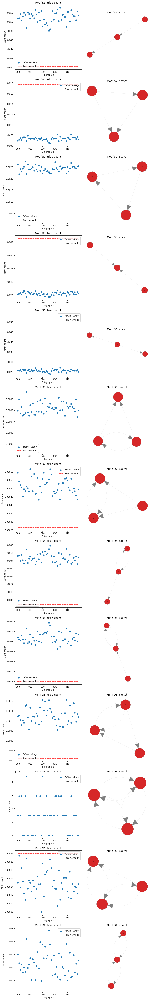

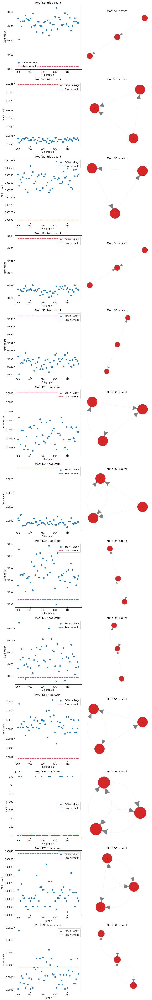

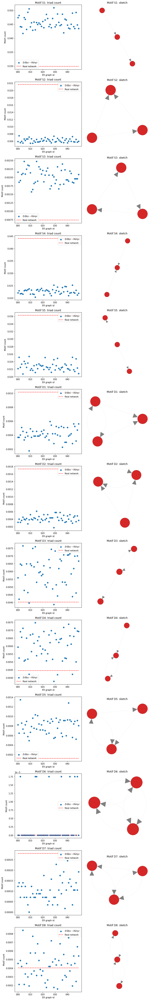

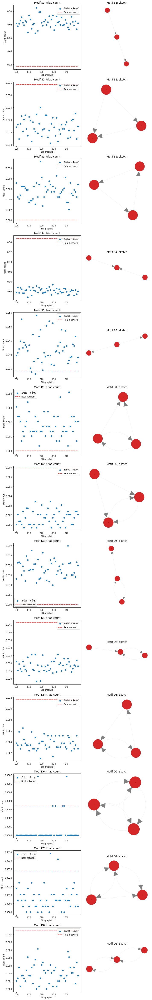

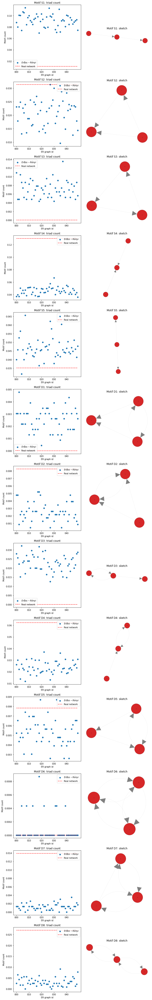

...

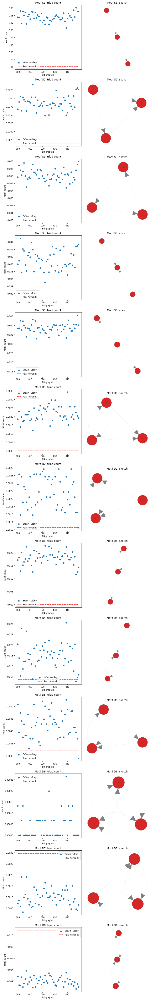

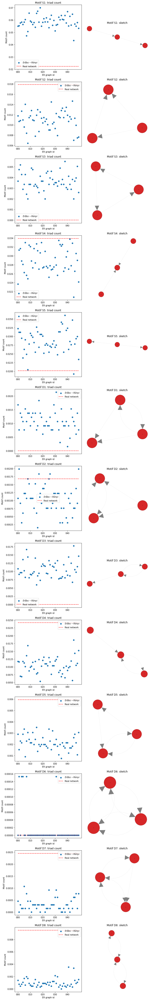

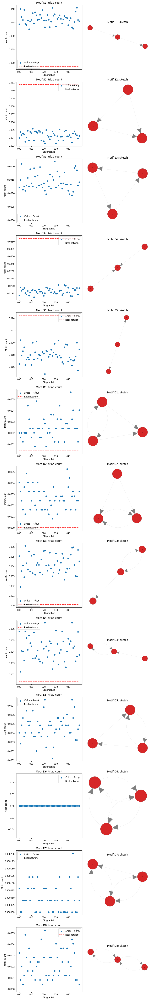

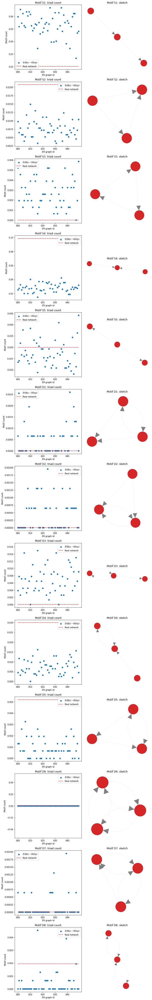

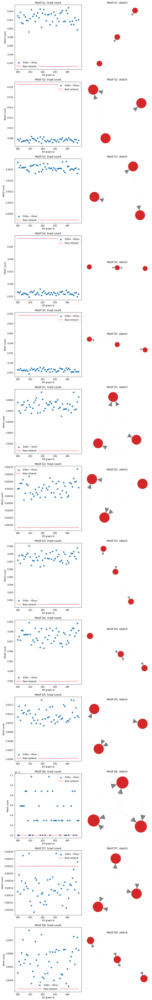

In [11]:
#@title Motif count for each experiment
%matplotlib inline
image_out_folder = './Motif representation in real networks vs. Erdos Renyi' #@param {type: 'string'}
execute = True #@param {type: 'boolean'}
scale = True #@param {type: 'boolean'}
if execute:
  if os.path.exists(image_out_folder) is False:
    os.makedirs(image_out_folder)

  id_columns = ['id', 'graph_name']
  size = 5
  H = load_motifs()

  graphs_dataset = df_er_tc['graph_name'].unique()
  iprog = 0
  out1 = Progress(max=len(graphs_dataset), title_name='Graph')
  out2 = display('', display_id = True)
  for graph_name in graphs_dataset:
    out1.show(iprog, status=graph_name)
    df_temp_tc = df_er_tc[(df_er_tc['graph_name'] == graph_name) & (df_er_tc['id'] != 'real')].dropna(axis=1, inplace = False)
    # df_temp_edge_cont = df_er_edge_cont[(df_er_edge_cont['graph_name'] == graph_name) & (df_er_edge_cont['id'] != 'real')].dropna(axis=1, inplace = False)
    motif_columns = []
    for col in df_temp_tc:
      if col in id_columns: continue
      motif_columns.append(col)
    n_motifs = len(motif_columns)
    fig, axs = plt.subplots(n_motifs, 2, figsize = (size * 2, size * n_motifs))
    for iax, motif_name in enumerate(motif_columns):
      x = df_temp_tc['id'].to_numpy()
      y_tc = df_temp_tc[motif_name].to_numpy()
      # y_edge_cont = df_temp_edge_cont[motif_name].to_numpy()
      y_tc_real = float(df_er_tc[(df_er_tc['graph_name'] == graph_name) & (df_er_tc['id'] == 'real')][motif_name])
      if scale:
        N = G_dataset[index_from_dataset(G_dataset, graph_name)].vcount()
        triads = N * (N-1) * (N-2) / 6
        y_tc = y_tc / triads
        y_tc_real = y_tc_real / triads
      # y_er_edge_cont = float(df_er_edge_cont[(df_er_edge_cont['graph_name'] == graph_name) & (df_er_edge_cont['id'] == 'real')][motif_name])
      axs[iax,0].scatter(x, y_tc, label=r'$Erd\H{o}s-R\'{e}nyi$')
      axs[iax,0].hlines(y_tc_real, x[0], x[-1], color = 'r', linestyle='--', label='Real network')
      axs[iax,0].set_xticks(axs[iax,0].get_xticks()[::10])
      axs[iax,0].set_title(f"Motif {motif_name}: triad count")
      axs[iax,0].set_xlabel("ER graph id")
      axs[iax,0].set_ylabel("Motif count")
      axs[iax,0].legend()

      # axs[iax,1].scatter(x, y_edge_cont)
      # axs[iax,1].hlines(y_er_edge_cont, x[0], x[-1], color = 'r', linestyle='--')
      # axs[iax,1].set_xticks(axs[iax,1].get_xticks()[::10])
      # axs[iax,1].set_title(f"Motif {motif_name}: contained edges")

      ig.plot(H[motif_name], target = axs[iax,1], **visual_style(H[motif_name]))
      axs[iax,1].set_title(f"Motif {motif_name}: sketch")

    outpath = os.path.join(image_out_folder, f'{graph_name}.pdf')
    # fig.suptitle(f"{graph_name} - Motif representation: real vs ER")
    fig.subplots_adjust(wspace=0, hspace=0)
    fig.tight_layout()
    fig.savefig(outpath)
    iprog += 1
    out2.update(f"Image saved in {outpath}.")
  out1.show(iprog, status='')
  del(df_temp_tc)
  # del(df_temp_edge_cont)

In [12]:
#@title Motif count mean and std
%matplotlib inline
image_out_folder = './Mean and StDev' #@param {type: 'string'}
execute = False #@param {type: 'boolean'}

if execute:
  if os.path.exists(image_out_folder) is False:
    os.makedirs(image_out_folder)

  id_columns = ['id', 'graph_name']
  size = 5
  H = load_motifs()

  graphs_dataset = df_er_tc['graph_name'].unique()
  iprog = 0
  out1 = Progress(max=len(graphs_dataset), title_name='Graph')
  out2 = display('', display_id = True)
  for graph_name in graphs_dataset:
    out1.show(iprog, status=graph_name)
    df_temp_tc = df_er_tc[(df_er_tc['graph_name'] == graph_name) & (df_er_tc['id'] != 'real')].dropna(axis=1, inplace = False)
    df_temp_edge_cont = df_er_edge_cont[(df_er_edge_cont['graph_name'] == graph_name) & (df_er_edge_cont['id'] != 'real')].dropna(axis=1, inplace = False)
    motif_columns = []
    for col in df_temp_tc:
      if col in id_columns: continue
      motif_columns.append(col)
    fig, axs = plt.subplots(2,1, figsize = (size * 2, size * 3))
    y_mean_tc = []
    y_err_tc = []
    y_mean_edge_cont = []
    y_err_edge_cont = []
    y_real_tc = []
    y_real_edge_cont = []

    for motif_name in motif_columns:
      y_tc = df_temp_tc[motif_name].to_numpy()
      y_edge_cont = df_temp_edge_cont[motif_name].to_numpy()
      y_er_tc = float(df_er_tc[(df_er_tc['graph_name'] == graph_name) & (df_er_tc['id'] == 'real')][motif_name])
      y_er_edge_cont = float(df_er_edge_cont[(df_er_edge_cont['graph_name'] == graph_name) & (df_er_edge_cont['id'] == 'real')][motif_name])

      y_mean_tc.append(np.mean(y_tc))
      y_err_tc.append(np.std(y_tc))

      y_mean_edge_cont.append(np.mean(y_edge_cont))
      y_err_edge_cont.append(np.std(y_edge_cont))

      y_real_tc.append(y_er_tc)
      y_real_edge_cont.append(y_er_tc)

    axs[0].errorbar(motif_columns, y_mean_tc, yerr = y_err_tc)
    axs[0].scatter(motif_columns, y_real_tc, color='r')
    axs[0].set_title("Triad count")
    axs[0].set_yscale('log')
    axs[1].errorbar(motif_columns, y_mean_edge_cont, yerr = y_err_tc)
    axs[1].scatter(motif_columns, y_real_edge_cont, color='r')
    axs[1].set_title("Edges conteined count")
    axs[1].set_yscale('log')
    outpath = f'{image_out_folder}{graph_name} - Mean and Standard devs.pdf'
    fig.savefig(outpath)
    iprog += 1
    out2.update(f"Image saved in {outpath}.")
  out1.show(iprog, status='')
  del(df_temp_tc)
  del(df_temp_edge_cont)

In [13]:
#@title Motif vs graph dataset

image_out_folder = '../Motif counting vs ER/One graph for each motif/' #@param {type: 'string'}
execute = False #@param {type: 'boolean'}

if execute:
  if os.path.exists(image_out_folder) is False:
    os.makedirs(image_out_folder)

  id_columns = ['id', 'graph_name']
  size = 5
  H = load_motifs()

  graphs_dataset = df_er_tc['graph_name'].unique()
  iprog = 0
  out1 = Progress(max=len(H.keys()), title_name='Motif')
  out2 = display('', display_id = True)

  G_available = sorted(df_er_tc.graph_name.unique())
  dataset_indices = [index_from_dataset(G_dataset, G) for G in G_available]
  G_dataset_available = [G_dataset[i] for i in dataset_indices]

  del(G_available)
  del(dataset_indices)

  for motif_name in H:

    out1.show(iprog, status=motif_name)
    x = []
    y_tc_mean = []
    y_tc_std = []
    y_tc_real = []
    y_edge_cont_mean = []
    y_edge_cont_std = []
    y_edge_cont_real = []

    for G in G_dataset_available:
      x.append(G['nickname'])
      y_tc_G = df_er_tc[(df_er_tc['graph_name'] == G['name']) & (df_er_tc['id'] != 'real')][motif_name].to_numpy()
      y_edge_cont_G = df_er_edge_cont[(df_er_edge_cont['graph_name'] == G['name']) & (df_er_edge_cont['id'] != 'real')][motif_name].to_numpy()

      y_tc_mean.append(np.mean(y_tc_G))
      y_tc_std.append(np.std(y_tc_G))
      y_tc_real.append(float(df_er_tc[(df_er_tc['graph_name'] == G['name']) & (df_er_tc['id'] == 'real')][motif_name].iloc[0]))

      y_edge_cont_mean.append(np.mean(y_edge_cont_G))
      y_edge_cont_std.append(np.std(y_edge_cont_G))
      y_edge_cont_real.append(float(df_er_edge_cont[(df_er_edge_cont['graph_name'] == G['name']) & (df_er_edge_cont['id'] == 'real')][motif_name].iloc[0]))

    fig, ax = plt.subplots(3,1,figsize=(8.3,11.7))
    ax[0].grid(which='major', c='black', alpha=0.3)
    ax[0].grid(which='minor', alpha=0.3)
    ax[0].set_axisbelow(True)
    ax[0].errorbar(x, y_tc_mean, yerr = y_tc_std, fmt = '.', label='ER')
    ax[0].scatter(x, y_tc_real, c = 'r', label='Real')
    ax[0].set_xticks(ax[0].get_xticks())
    ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90, ha='center')
    ax[0].set_yscale('log')
    ax[0].set_title('Triads census')
    ax[0].legend()

    ax[1].grid(which='major', c='black', alpha=0.3)
    ax[1].grid(which='minor', alpha=0.3)
    ax[1].set_axisbelow(True)
    ax[1].errorbar(x, y_edge_cont_mean, yerr = y_edge_cont_std, fmt = '.', label='ER')
    ax[1].scatter(x, y_edge_cont_real, c = 'r', label='Real')
    ax[1].set_xticks(ax[1].get_xticks())
    ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=90, ha='center')
    ax[1].set_yscale('log')
    ax[1].set_title('Motif contained in graph')
    ax[1].legend()

    ig.plot(H[motif_name], target = ax[2], **visual_style(H[motif_name]))
    fig.suptitle(f"Motif {motif_name} in the Dataset")
    fig.tight_layout()
    fig.savefig(f"{image_out_folder}{motif_name}.pdf")
    out2.update(f"Image saved in {image_out_folder}{motif_name}.pdf")
    iprog += 1

In [14]:
#@title Z-score on Triad Count

out_path = './Z - Score Triad Count/df_tc_z_score.pickle'             #@param {type:"string"}
create_folder(out_path)

series = []
available_graphs = [G['name'] for G in G_dataset if G['name'] in df_er_tc.graph_name.unique()]
nicknames = [G_dataset[index_from_dataset(G_dataset, name)]['nickname'] for name in available_graphs]
for graph_name in available_graphs:
  df_temp = df_er_tc[df_er_tc['graph_name'] == graph_name].iloc[:-1,2:]
  N_real = df_er_tc[df_er_tc['graph_name'] == graph_name].iloc[-1,2:]
  mean_N_er = df_temp.mean()
  sigma_N_er = df_temp.std()
  series.append((N_real - mean_N_er) / sigma_N_er)  # cfr. eq (2.1) - Stouffer 2007
del(df_temp)
df_tc_z_score = pd.DataFrame(series)
df_tc_z_score.insert(0, 'graph_name', available_graphs)
df_tc_z_score.insert(1, 'nickname', nicknames)
df_tc_z_score.to_pickle(out_path)

# Stouffer, D. B., Camacho, J., Jiang, W., & Nunes Amaral, L. A. "Evidence for the existence of a robust pattern of prey selection in food webs."
# Proceedings of the Royal Society B: Biological Sciences 274.1621 (2007): 1931-1940.

'Image saved in ./Motif - Heatmap of representation for each graph.pdf'

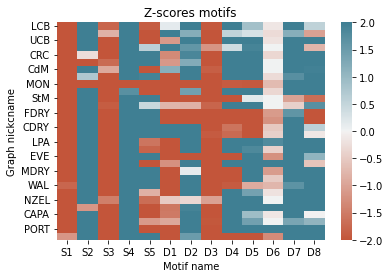

In [15]:
import seaborn as sns

out_path = './Motif - Heatmap of representation for each graph.pdf' #@param {type: 'string'}
create_folder(out_path)
df_triad_census_z_score_vis = df_tc_z_score.iloc[:,1:].set_index('nickname').fillna(0)
fig = sns.heatmap(df_triad_census_z_score_vis, vmin=-2, vmax = 2, cmap=sns.diverging_palette(20, 220, as_cmap=True)).get_figure()
ax = fig.get_axes()
ax[0].set_ylabel('Graph nickcname')
ax[0].set_xlabel('Motif name')
ax[0].set_title("Z-scores motifs")

fig.savefig(out_path)
display(f'Image saved in {out_path}')

'Image saved in ./Z - score profiles.pdf'

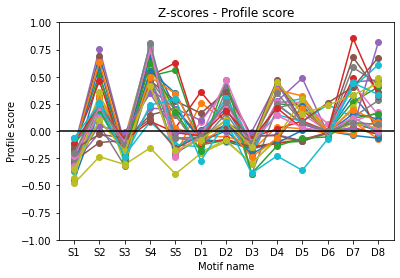

In [16]:
out_path = './Z - score profiles.pdf' #@param {type: 'string'}
create_folder(out_path)

df_triad_census_profile_score_z = df_triad_census_z_score_vis.iloc[:,:].apply(lambda x: x / np.sqrt(np.sum(x*x)), axis=1)
fig, ax = plt.subplots()

for row in df_triad_census_profile_score_z.iterrows():
  ax.plot(row[1].index, row[1].values, marker='o')
# ax.bar(x=series.index, height=series, color=cmap(norm(series)), yerr=err)
ax.set_ylabel('Profile score')
ax.set_xlabel('Motif name')
ax.set_title("Z-scores - Profile score")
xlim = ax.get_xlim()
ax.hlines(0, xlim[0], xlim[1], color='black')
ax.set_xlim(xlim[0], xlim[1])
ax.set_ylim(-1, 1)

fig.savefig(out_path)
display(f'Image saved in {out_path}')